# Table of Contents
 <p><div class="lev1 toc-item"><a href="#Feature-importance-and-correlation-investigation" data-toc-modified-id="Feature-importance-and-correlation-investigation-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Feature importance and correlation investigation</a></div><div class="lev1 toc-item"><a href="#CV-scoring-and-model-selection-(2010-2015-only)" data-toc-modified-id="CV-scoring-and-model-selection-(2010-2015-only)-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>CV scoring and model selection (2010-2015 only)</a></div><div class="lev1 toc-item"><a href="#SCRATCH" data-toc-modified-id="SCRATCH-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>SCRATCH</a></div>

In [1]:
import pandas as pd
import numpy as np
import os
import datetime

import matplotlib
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
import seaborn as sns

from sklearn import tree
from sklearn import ensemble

import itertools

from sklearn import metrics
from sklearn import model_selection

import pvlib
import cs_detection
import utils
import visualize_plotly as visualize
sns.set_style("white")

matplotlib.rcParams['figure.figsize'] = (20., 8.)

from IPython.display import Image

from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import plotly.graph_objs as go
import cufflinks as cf
cf.go_offline()
init_notebook_mode(connected=True)

%load_ext autoreload
%autoreload 2

np.set_printoptions(precision=4)
%matplotlib inline

%config InlineBackend.figure_format = 'retina'

matplotlib.rcParams.update({'font.size': 16})

import warnings
# warnings.filterwarnings(action='ignore')

import xgboost as xgb


plt.close('all')

import pygal

# Feature importance and correlation investigation

The previous two sections show promising results going from default to cleaned data.  We see marked improvements in scoring and the confusion matrix.  The features used in both cases are highly correlated, though.  Here we will look at feature importances in a different way - by removing 1 at a time and recalculating the F1 score.

/Users/benellis/duramat/clearsky_detection/utils.py:371: RuntimeWarning:

Large scaling value.  Day will not be further assessed or scaled.

/Users/benellis/duramat/clearsky_detection/utils.py:378: RuntimeWarning:

Scaling did not converge.



    F1: 0.9951586874663798


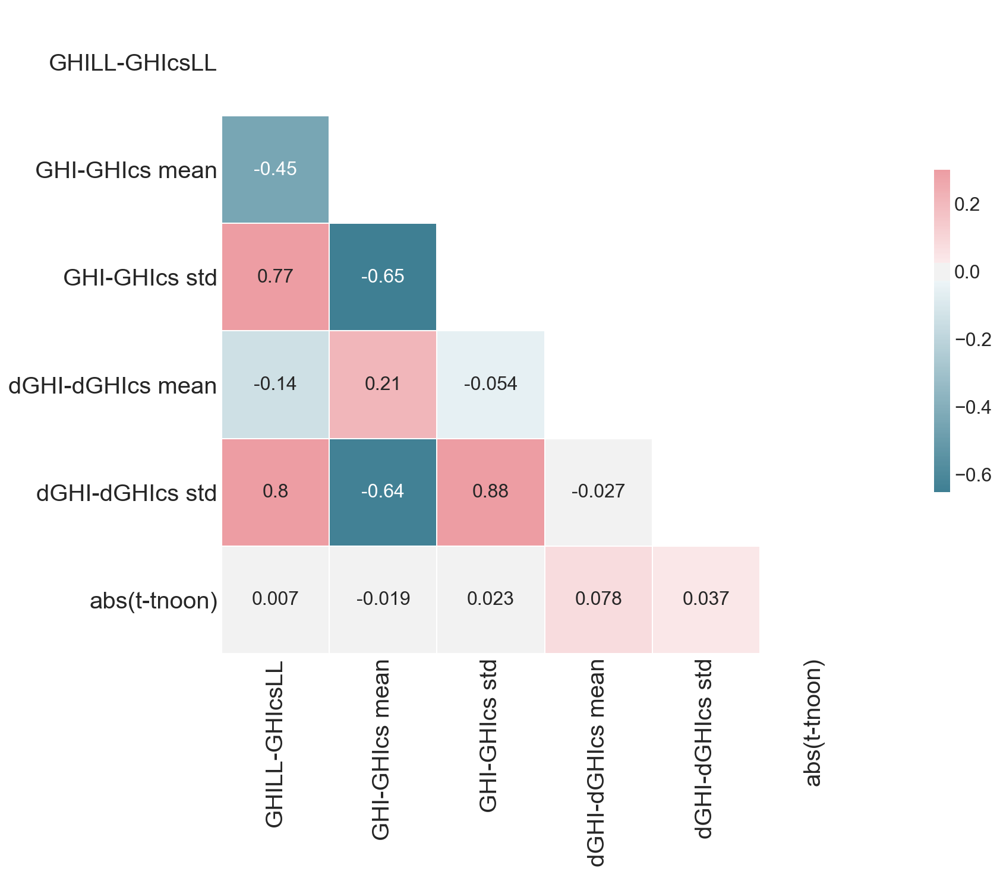

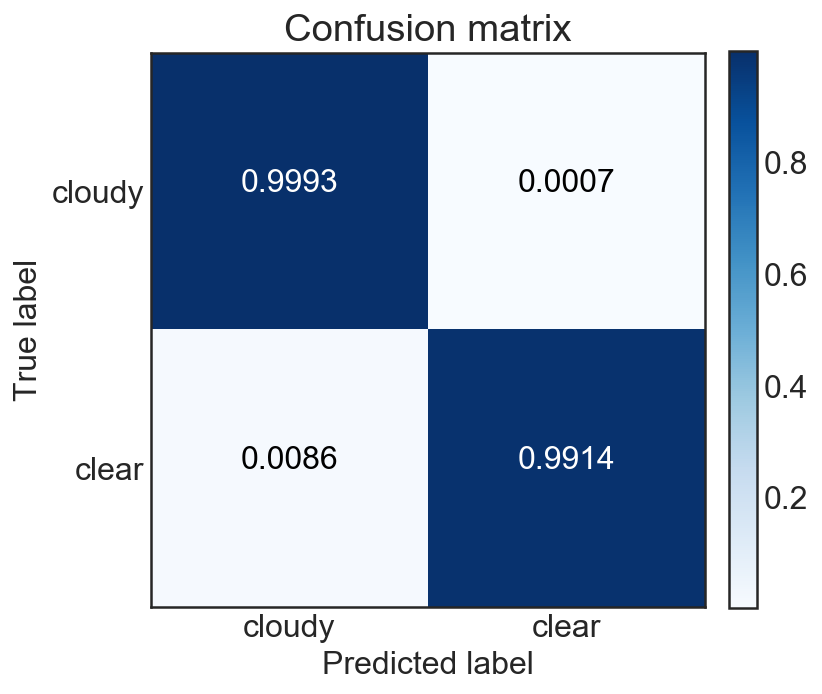

In [2]:
detect_obj = cs_detection.ClearskyDetection.read_pickle('srrl_nsrdb_1.pkl.gz', 'GHI', 'Clearsky GHI pvlib', 'sky_status')
detect_obj.df.index = detect_obj.df.index.tz_convert('MST')
train_obj = cs_detection.ClearskyDetection(detect_obj.df, 'GHI', 'Clearsky GHI pvlib', 'sky_status')
train_obj.trim_dates(None, '01-01-2015')
# train_obj.features_ = features
test_obj = cs_detection.ClearskyDetection(detect_obj.df, 'GHI', 'Clearsky GHI pvlib', 'sky_status')
test_obj.trim_dates('01-01-2015', None)
# test_obj.features_ = features
clf = ensemble.RandomForestClassifier(n_jobs=-1, n_estimators=32, random_state=42)
clf = train_obj.fit_model(clf, ratio_mean_val=0.95, diff_mean_val=50)
pred = test_obj.predict(clf)
test_obj.filter_labels(ratio_mean_val=0.95, diff_mean_val=50)
f1_score = metrics.f1_score(test_obj.df[test_obj.df['quality_mask']]['sky_status'], pred[test_obj.df['quality_mask']])
# print('Full features'.format([i for i in features]))
print('    F1: {}'.format(f1_score))
vis = visualize.Visualizer()
vis.plot_corr_matrix(test_obj.df[test_obj.features_].corr().values, test_obj.features_)
cm = metrics.confusion_matrix(test_obj.df[test_obj.df['quality_mask']]['sky_status'], pred[test_obj.df['quality_mask']])
visualize.plot_confusion_matrix2(cm, ('cloudy', 'clear'))
nsrdb = detect_obj.df

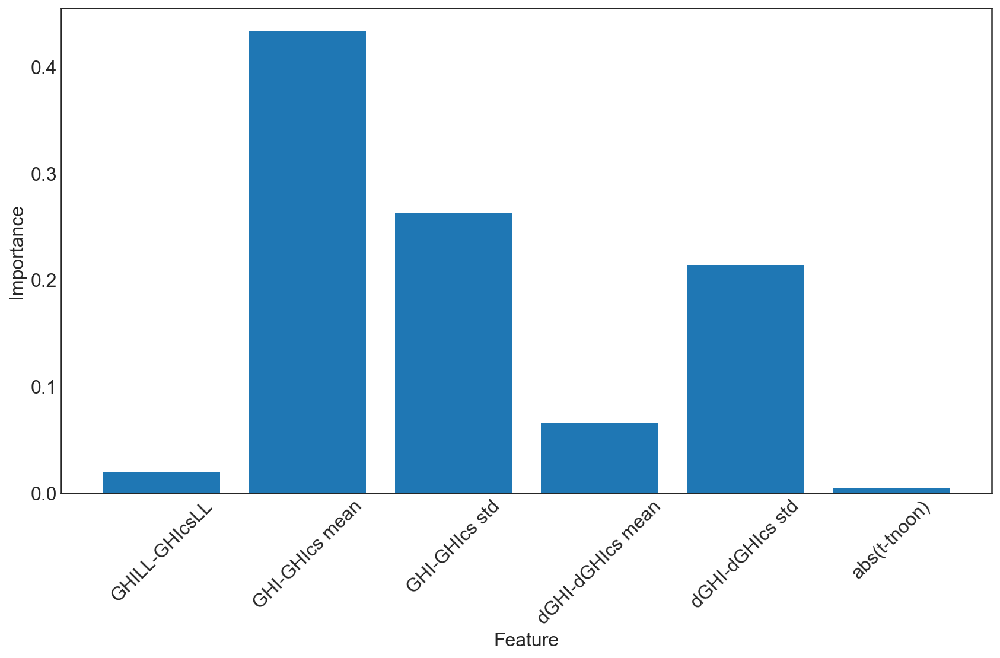

In [3]:
fig, ax = plt.subplots(figsize=(12, 8))

_ = ax.bar(range(len(clf.feature_importances_)), clf.feature_importances_)
_ = ax.set_xticks(range(len(clf.feature_importances_)))
_ = ax.set_xticklabels(test_obj.features_, rotation=45)

_ = ax.set_ylabel('Importance')
_ = ax.set_xlabel('Feature')

_ = fig.tight_layout()

In [4]:
# fig, ax = plt.subplots(figsize=(12, 8))

nsrdb_mask = test_obj.df['sky_status'].values

trace1 = go.Scatter(x=test_obj.df.index, y=test_obj.df['GHI'], name='GHI')
trace2 = go.Scatter(x=test_obj.df.index, y=test_obj.df['Clearsky GHI pvlib'], name='GHIcs')
trace3 = go.Scatter(x=test_obj.df[nsrdb_mask & ~pred].index, y=test_obj.df[nsrdb_mask & ~pred]['GHI'], name='NSRDB only', mode='markers', marker={'size': 10})
trace4 = go.Scatter(x=test_obj.df[pred & ~nsrdb_mask].index, y=test_obj.df[pred & ~nsrdb_mask]['GHI'], name='RF only', mode='markers', marker={'size': 10})
trace5 = go.Scatter(x=test_obj.df[nsrdb_mask & pred].index, y=test_obj.df[nsrdb_mask & pred]['GHI'], name='Both', mode='markers', marker={'size': 10})
# _ = ax.legend(bbox_to_anchor=(1.25, 1))

# _ = ax.set_xlabel('Date')
# _ = ax.set_ylabel('GHI / Wm$^{-2}$')
iplot([trace1, trace2, trace3, trace4, trace5])

# CV scoring and model selection (2010-2015 only)

In [5]:
detect_obj = cs_detection.ClearskyDetection.read_pickle('srrl_ground_1.pkl.gz', 'GHI', 'Clearsky GHI pvlib')
detect_obj.df.index = detect_obj.df.index.tz_convert('MST')
detect_obj.trim_dates('05-01-2012', '05-06-2012')
detect_obj.df['sky_status'] = nsrdb['sky_status']
# detect_obj.features_ = features

In [6]:
detect_obj.df['sky_status'] = detect_obj.df['sky_status'].fillna(False)

In [7]:
pred = detect_obj.predict(clf)

In [9]:
vis = visualize.Visualizer()
df_ground = detect_obj.df
# df_ground = df_ground[(df_ground.index >= '05-01-2012') & (df_ground.index < '05-06-2012')]
vis.add_line_ser(df_ground['GHI'], 'GHI')
vis.add_line_ser(df_ground['Clearsky GHI pvlib'], 'GHIcs')
vis.add_circle_ser(df_ground[pred & ~df_ground['sky_status']]['GHI'], 'ML clear only')
vis.add_circle_ser(df_ground[~pred & df_ground['sky_status']]['GHI'], 'NSRDB clear only')
vis.add_circle_ser(df_ground[pred & df_ground['sky_status']]['GHI'], 'Both clear')
# vis.add_line_ser(ground2_test.df['GHI'], 'Grnd GHI')
# vis.add_line_ser(ground2_test.df['Clearsky GHI pvlib'], 'Grnd GHIcs')
# vis.add_circle_ser(ground2_test.df[pred]['GHI'], 'ML clear')
# vis.add_circle_ser(ground2_test.df[ground2_test.df['sky_status']]['GHI'], 'NSRDB clear')
vis.show()
# trace1 = go.Scatter(x=detect_obj.df.index, y=detect_obj.df['GHI'], name='GHI')
# trace2 = go.Scatter(x=detect_obj.df.index, y=detect_obj.df['Clearsky GHI pvlib'], name='GHIcs')
# trace3 = go.Scatter(x=detect_obj.df[pred].index, 
#                     y=detect_obj.df[pred]['GHI'], name='ML clear', mode='markers', marker={'size': 10})
# trace4 = go.Scatter(x=detect_obj.df[detect_obj.df['sky_status']].index, y=detect_obj.df[detect_obj.df['sky_status']]['GHI'], name='NSRDB clear', mode='markers', marker={'size': 10})
# iplot([trace1, trace2, trace3, trace4])

In [19]:
detect_obj = cs_detection.ClearskyDetection.read_pickle('srrl_ground_1.pkl.gz', 'GHI', 'Clearsky GHI pvlib')
detect_obj.df.index = detect_obj.df.index.tz_convert('MST')
detect_obj.trim_dates('05-01-2012', '05-06-2012')
detect_obj.df['sky_status'] = nsrdb['sky_status']
detect_obj.df['sky_status'] = detect_obj.df['sky_status'].fillna(False)
# detect_obj.features_ = features

In [20]:
detect_obj.downsample(5)

In [21]:
pred = detect_obj.predict(clf)

In [22]:
vis = visualize.Visualizer()
df_ground = detect_obj.df
# df_ground = df_ground[(df_ground.index >= '05-01-2012') & (df_ground.index < '05-06-2012')]
vis.add_line_ser(df_ground['GHI'], 'GHI')
vis.add_line_ser(df_ground['Clearsky GHI pvlib'], 'GHIcs')
vis.add_circle_ser(df_ground[pred & ~df_ground['sky_status']]['GHI'], 'ML clear only')
vis.add_circle_ser(df_ground[~pred & df_ground['sky_status']]['GHI'], 'NSRDB clear only')
vis.add_circle_ser(df_ground[pred & df_ground['sky_status']]['GHI'], 'Both clear')
# vis.add_line_ser(ground2_test.df['GHI'], 'Grnd GHI')
# vis.add_line_ser(ground2_test.df['Clearsky GHI pvlib'], 'Grnd GHIcs')
# vis.add_circle_ser(ground2_test.df[pred]['GHI'], 'ML clear')
# vis.add_circle_ser(ground2_test.df[ground2_test.df['sky_status']]['GHI'], 'NSRDB clear')
vis.show()
# trace1 = go.Scatter(x=detect_obj.df.index, y=detect_obj.df['GHI'], name='GHI')
# trace2 = go.Scatter(x=detect_obj.df.index, y=detect_obj.df['Clearsky GHI pvlib'], name='GHIcs')
# trace3 = go.Scatter(x=detect_obj.df[pred].index, 
#                     y=detect_obj.df[pred]['GHI'], name='ML clear', mode='markers', marker={'size': 10})
# trace4 = go.Scatter(x=detect_obj.df[detect_obj.df['sky_status']].index, y=detect_obj.df[detect_obj.df['sky_status']]['GHI'], name='NSRDB clear', mode='markers', marker={'size': 10})
# iplot([trace1, trace2, trace3, trace4])

In [26]:
detect_obj = cs_detection.ClearskyDetection.read_pickle('srrl_ground_1.pkl.gz', 'GHI', 'Clearsky GHI pvlib')
detect_obj.df.index = detect_obj.df.index.tz_convert('MST')
detect_obj.trim_dates('05-01-2012', '05-06-2012')
detect_obj.df['sky_status'] = nsrdb['sky_status']
detect_obj.df['sky_status'] = detect_obj.df['sky_status'].fillna(False)
# detect_obj.features_ = features

In [27]:
detect_obj.downsample(10)

In [28]:
pred = detect_obj.predict(clf)

In [29]:
vis = visualize.Visualizer()
df_ground = detect_obj.df
# df_ground = df_ground[(df_ground.index >= '05-01-2012') & (df_ground.index < '05-06-2012')]
vis.add_line_ser(df_ground['GHI'], 'GHI')
vis.add_line_ser(df_ground['Clearsky GHI pvlib'], 'GHIcs')
vis.add_circle_ser(df_ground[pred & ~df_ground['sky_status']]['GHI'], 'ML clear only')
vis.add_circle_ser(df_ground[~pred & df_ground['sky_status']]['GHI'], 'NSRDB clear only')
vis.add_circle_ser(df_ground[pred & df_ground['sky_status']]['GHI'], 'Both clear')
# vis.add_line_ser(ground2_test.df['GHI'], 'Grnd GHI')
# vis.add_line_ser(ground2_test.df['Clearsky GHI pvlib'], 'Grnd GHIcs')
# vis.add_circle_ser(ground2_test.df[pred]['GHI'], 'ML clear')
# vis.add_circle_ser(ground2_test.df[ground2_test.df['sky_status']]['GHI'], 'NSRDB clear')
vis.show()
# trace1 = go.Scatter(x=detect_obj.df.index, y=detect_obj.df['GHI'], name='GHI')
# trace2 = go.Scatter(x=detect_obj.df.index, y=detect_obj.df['Clearsky GHI pvlib'], name='GHIcs')
# trace3 = go.Scatter(x=detect_obj.df[pred].index, 
#                     y=detect_obj.df[pred]['GHI'], name='ML clear', mode='markers', marker={'size': 10})
# trace4 = go.Scatter(x=detect_obj.df[detect_obj.df['sky_status']].index, y=detect_obj.df[detect_obj.df['sky_status']]['GHI'], name='NSRDB clear', mode='markers', marker={'size': 10})
# iplot([trace1, trace2, trace3, trace4])

In [30]:
detect_obj = cs_detection.ClearskyDetection.read_pickle('srrl_ground_1.pkl.gz', 'GHI', 'Clearsky GHI pvlib')
detect_obj.df.index = detect_obj.df.index.tz_convert('MST')
detect_obj.trim_dates('05-01-2012', '05-06-2012')
detect_obj.df['sky_status'] = nsrdb['sky_status']
detect_obj.df['sky_status'] = detect_obj.df['sky_status'].fillna(False)
# detect_obj.features_ = features

In [31]:
detect_obj.downsample(15)

In [32]:
pred = detect_obj.predict(clf)

In [34]:
vis = visualize.Visualizer()
df_ground = detect_obj.df
# df_ground = df_ground[(df_ground.index >= '05-01-2012') & (df_ground.index < '05-06-2012')]
vis.add_line_ser(df_ground['GHI'], 'GHI')
vis.add_line_ser(df_ground['Clearsky GHI pvlib'], 'GHIcs')
vis.add_circle_ser(df_ground[pred & ~df_ground['sky_status']]['GHI'], 'ML clear only')
vis.add_circle_ser(df_ground[~pred & df_ground['sky_status']]['GHI'], 'NSRDB clear only')
vis.add_circle_ser(df_ground[pred & df_ground['sky_status']]['GHI'], 'Both clear')
# vis.add_line_ser(ground2_test.df['GHI'], 'Grnd GHI')
# vis.add_line_ser(ground2_test.df['Clearsky GHI pvlib'], 'Grnd GHIcs')
# vis.add_circle_ser(ground2_test.df[pred]['GHI'], 'ML clear')
# vis.add_circle_ser(ground2_test.df[ground2_test.df['sky_status']]['GHI'], 'NSRDB clear')
vis.show()
# trace1 = go.Scatter(x=detect_obj.df.index, y=detect_obj.df['GHI'], name='GHI')
# trace2 = go.Scatter(x=detect_obj.df.index, y=detect_obj.df['Clearsky GHI pvlib'], name='GHIcs')
# trace3 = go.Scatter(x=detect_obj.df[pred].index, 
#                     y=detect_obj.df[pred]['GHI'], name='ML clear', mode='markers', marker={'size': 10})
# trace4 = go.Scatter(x=detect_obj.df[detect_obj.df['sky_status']].index, y=detect_obj.df[detect_obj.df['sky_status']]['GHI'], name='NSRDB clear', mode='markers', marker={'size': 10})
# iplot([trace1, trace2, trace3, trace4])

In [35]:
detect_obj = cs_detection.ClearskyDetection.read_pickle('srrl_ground_1.pkl.gz', 'GHI', 'Clearsky GHI pvlib')
detect_obj.df.index = detect_obj.df.index.tz_convert('MST')
detect_obj.trim_dates('05-01-2012', '05-06-2012')
detect_obj.df['sky_status'] = nsrdb['sky_status']
detect_obj.df['sky_status'] = detect_obj.df['sky_status'].fillna(False)
# detect_obj.features_ = features

In [36]:
detect_obj.downsample(30)

In [37]:
pred = detect_obj.predict(clf)

In [38]:
vis = visualize.Visualizer()
df_ground = detect_obj.df
# df_ground = df_ground[(df_ground.index >= '05-01-2012') & (df_ground.index < '05-06-2012')]
vis.add_line_ser(df_ground['GHI'], 'GHI')
vis.add_line_ser(df_ground['Clearsky GHI pvlib'], 'GHIcs')
vis.add_circle_ser(df_ground[pred & ~df_ground['sky_status']]['GHI'], 'ML clear only')
vis.add_circle_ser(df_ground[~pred & df_ground['sky_status']]['GHI'], 'NSRDB clear only')
vis.add_circle_ser(df_ground[pred & df_ground['sky_status']]['GHI'], 'Both clear')
# vis.add_line_ser(ground2_test.df['GHI'], 'Grnd GHI')
# vis.add_line_ser(ground2_test.df['Clearsky GHI pvlib'], 'Grnd GHIcs')
# vis.add_circle_ser(ground2_test.df[pred]['GHI'], 'ML clear')
# vis.add_circle_ser(ground2_test.df[ground2_test.df['sky_status']]['GHI'], 'NSRDB clear')
vis.show()
# trace1 = go.Scatter(x=detect_obj.df.index, y=detect_obj.df['GHI'], name='GHI')
# trace2 = go.Scatter(x=detect_obj.df.index, y=detect_obj.df['Clearsky GHI pvlib'], name='GHIcs')
# trace3 = go.Scatter(x=detect_obj.df[pred].index, 
#                     y=detect_obj.df[pred]['GHI'], name='ML clear', mode='markers', marker={'size': 10})
# trace4 = go.Scatter(x=detect_obj.df[detect_obj.df['sky_status']].index, y=detect_obj.df[detect_obj.df['sky_status']]['GHI'], name='NSRDB clear', mode='markers', marker={'size': 10})
# iplot([trace1, trace2, trace3, trace4])

In [ ]:
test_obj.df.index[-1]

# SCRATCH

The previous two sections show promising results going from default to cleaned data.  We see marked improvements in scoring and the confusion matrix.  The features used in both cases are highly correlated, though.  Here we will look at feature importances in a different way - by removing 1 at a time and recalculating the F1 score.